In [ ]:
!wget https://github.com/oyyd/frozen_east_text_detection.pb/raw/master/frozen_east_text_detection.pb

In [ ]:
from google.colab.patches import cv2_imshow


In [ ]:
import cv2
import numpy as np

def detect_text(image_path):
    # Read the image
    image = cv2.imread(image_path)
    orig = image.copy()
    (H, W) = image.shape[:2]

    # Set the new width and height and determine the ratio
    (newW, newH) = (320, 320)
    rW = W / float(newW)
    rH = H / float(newH)

    # Resize the image
    image = cv2.resize(image, (newW, newH))
    (H, W) = image.shape[:2]

    # Define the two output layer names for the EAST detector model
    layerNames = [
        "feature_fusion/Conv_7/Sigmoid",
        "feature_fusion/concat_3"]

    # Load the pre-trained EAST text detector
    model_path = "/content/frozen_east_text_detection.pb"  # Update with the correct path
    net = cv2.dnn.readNet(model_path)
    #net = cv2.dnn.readNet("frozen_east_text_detection.pb")

    # Construct a blob from the image and perform a forward pass
    blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),
        (123.68, 116.78, 103.94), swapRB=True, crop=False)
    net.setInput(blob)
    (scores, geometry) = net.forward(layerNames)

    # Grab the number of rows and columns from the scores volume
    (numRows, numCols) = scores.shape[2:4]
    rects = []
    confidences = []

    # Loop over the number of rows
    for y in range(0, numRows):
        scoresData = scores[0, 0, y]
        xData0 = geometry[0, 0, y]
        xData1 = geometry[0, 1, y]
        xData2 = geometry[0, 2, y]
        xData3 = geometry[0, 3, y]
        anglesData = geometry[0, 4, y]

        # Loop over the number of columns
        for x in range(0, numCols):
            if scoresData[x] < 0.5:
                continue

            (offsetX, offsetY) = (x * 4.0, y * 4.0)

            angle = anglesData[x]
            cos = np.cos(angle)
            sin = np.sin(angle)

            h = xData0[x] + xData2[x]
            w = xData1[x] + xData3[x]

            endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
            endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
            startX = int(endX - w)
            startY = int(endY - h)

            rects.append((startX, startY, endX, endY))
            confidences.append(scoresData[x])

    # Apply non-maxima suppression to suppress weak, overlapping bounding boxes
    boxes = cv2.dnn.NMSBoxes(rects, confidences, 0.5, 0.3)

    # Loop over the bounding boxes
    for i in boxes.flatten():
        (x, y, w, h) = (rects[i][0], rects[i][1], rects[i][2] - rects[i][0], rects[i][3] - rects[i][1])

        # Scale the bounding box coordinates
        (x, y) = (int(x * rW), int(y * rH))
        (w, h) = (int(w * rW), int(h * rH))

        # Draw a green rectangle around the text
        cv2.rectangle(orig, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Put the confidence score on the bounding box
        conf_text = f"{confidences[i]:.2f}"
        cv2.putText(orig, conf_text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Show the output image
    print("Text Detection")
    cv2_imshow(orig)
    cv2.waitKey(0)

# Usage
detect_text("/content/batch_card_photo.jpg")


In [ ]:
!pip install paddleocr

In [ ]:
!pip install paddlepaddle

In [ ]:
from paddleocr import PaddleOCR
import cv2
import numpy as np

def detect_text(image_path):
    # Initialize PaddleOCR
    ocr = PaddleOCR(use_angle_cls=True, lang='en')

    # Read the image
    img = cv2.imread(image_path)

    # Perform OCR
    result = ocr.ocr(img, cls=True)

    # Draw bounding boxes and probabilities
    for line in result:
        for box in line:
            bbox = np.array(box[0]).astype(int).reshape(-1, 2)
            prob = box[1][1]

            # Draw green bounding box
            cv2.polylines(img, [bbox], True, (0, 255, 0), 2)

            # Put probability text
            text = f"{prob:.2f}"
            cv2.putText(img, text, (bbox[0][0], bbox[0][1] - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the result
    print("Text Detection")
    cv2_imshow(img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Usage
detect_text("/content/barcode_qrcode_pic.png")


In [ ]:
!pip install easyocr

In [ ]:
import cv2
import numpy as np
from paddleocr import PaddleOCR, draw_ocr
import easyocr

def detect_text(image_path):
    # Load image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # PaddleOCR
    paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en')
    paddle_result = paddle_ocr.ocr(image_rgb, cls=True)

    # EasyOCR
    easy_reader = easyocr.Reader(['en'])
    easy_result = easy_reader.readtext(image_rgb)

    # Combine results
    for box in paddle_result[0]:
        bbox = np.array(box[0]).astype(int)
        score = box[1][1]
        cv2.polylines(image, [bbox], True, (0, 255, 0), 2)
        cv2.putText(image, f"{score:.2f}", (bbox[0][0], bbox[0][1] - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    for detection in easy_result:
        bbox = np.array(detection[0]).astype(int)
        score = detection[2]
        cv2.polylines(image, [bbox], True, (0, 255, 0), 2)
        cv2.putText(image, f"{score:.2f}", (bbox[0][0], bbox[0][1] - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display result
    print("Text Detection")
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Usage
detect_text("/content/batch_card_photo.jpg")


In [ ]:
!pip install easyocr

In [ ]:
!pip install paddleocr

In [ ]:
!pip install paddlepaddle

In [ ]:
!pip install easyocr

[2025/02/11 09:10:47] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

Detected Text:

PaddleOCR Results:
Text: FormatF-MFG-01 Rov401.10.2019, Score: 0.95
Text: INTERNATIONAL AEROSPACE, Score: 0.99
Text: MANUFACTURING Pvt Ltd, Score: 0.96
Text: IAMPL, Score: 0.99
Text: BATCH CARD, Score: 0.95
Text: Finish Part No, Score: 0.90
Text: Rev No, Score: 0.80
Text: Batch Card Number, Score: 0.96
Text: Batch Qty, Score: 0.97
Text: KH72808, Score: 0.96
Text: BLR110104, Score: 1.00
Text: *BLR110104$KH72808$1, Score: 0.99
Text: Bill of Material, Score: 0.92
Text: Rev No, Score: 0.89
Text: Launch Date, Score: 0.98
Text: Comp Date, Score: 0.97
Text: Finish Part Serial No:, Score: 0.93
Text: Refoct:, Score: 0.87
Text: NOF009797, Score: 0.93
Text: 20/12/2024, Score: 1.00
Text: 20/12/2024, Score: 1.00
Text: IM-CTT-TIN-, Score: 0.93
Text: K00866-, Score: 0.97
Text: A070, Score: 0.88
Text: DM-CON-PWD-, Score: 0.96
Text: A002, Score: 0.96
Text: 0, Score: 0.80
Text: U755552, Score: 0.99
Text: IM-CTT-TIN-, Score: 0.96
Text: A297, Score: 0.98
Text: MPSNO, Score: 0.88
Text: Meth

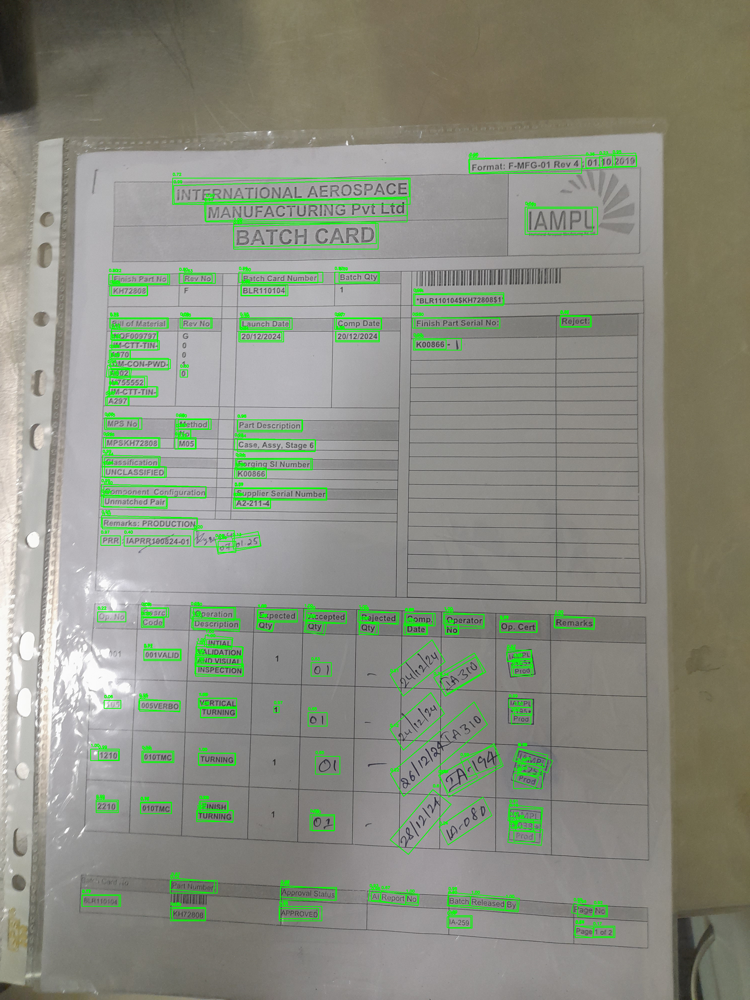

In [ ]:
import cv2
import numpy as np
from paddleocr import PaddleOCR, draw_ocr
import easyocr
from google.colab.patches import cv2_imshow

def detect_text(image_path):
    # Load image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_image = image.copy()

    # PaddleOCR
    paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en')
    paddle_result = paddle_ocr.ocr(image_rgb, cls=True)

    # EasyOCR
    easy_reader = easyocr.Reader(['en'])
    easy_result = easy_reader.readtext(image_rgb)

    # Process and display results
    print("Detected Text:")
    for idx, (method, results) in enumerate([("PaddleOCR", paddle_result[0]), ("EasyOCR", easy_result)]):
        print(f"\n{method} Results:")
        for detection in results:
            if method == "PaddleOCR":
                bbox = np.array(detection[0]).astype(int)
                text = detection[1][0]
                score = detection[1][1]
            else:  # EasyOCR
                bbox = np.array(detection[0]).astype(int)
                text = detection[1]
                score = detection[2]

            # Draw green bounding box
            cv2.polylines(result_image, [bbox], True, (0, 255, 0), 2)

            # Put score on the bounding box
            cv2.putText(result_image, f"{score:.2f}", (bbox[0][0], bbox[0][1] - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

            print(f"Text: {text}, Score: {score:.2f}")

    # Display result
    print("Text Detection")
    cv2_imshow(result_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Usage
detect_text("/content/batch_card_photo.jpg")


In [ ]:
import cv2
import numpy as np
from paddleocr import PaddleOCR, draw_ocr
import easyocr
from google.colab.patches import cv2_imshow

def detect_text(image_path):
    # Load image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_image = image.copy()

    # PaddleOCR
    paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en')
    paddle_result = paddle_ocr.ocr(image_rgb, cls=True)

    # EasyOCR
    easy_reader = easyocr.Reader(['en'])
    easy_result = easy_reader.readtext(image_rgb)

    # Process and display results
    print("Detected Text:")
    for idx, (method, results) in enumerate([("PaddleOCR", paddle_result[0]), ("EasyOCR", easy_result)]):
        print(f"\n{method} Results:")
        for detection in results:
            if method == "PaddleOCR":
                bbox = np.array(detection[0]).astype(int)
                text = detection[1][0]
                score = detection[1][1]
            else:  # EasyOCR
                bbox = np.array(detection[0]).astype(int)
                text = detection[1]
                score = detection[2]

            # Draw green bounding box
            cv2.polylines(result_image, [bbox], True, (0, 255, 0), 2)

            # Put score on the bounding box
            cv2.putText(result_image, f"{score:.2f}", (bbox[0][0], bbox[0][1] - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

            print(f"Text: {text}, Score: {score:.2f}")

    # Display result
    print("Text Detection")
    cv2_imshow(result_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Usage
detect_text("/content/batch_card_photo - Copy.jpg")


In [ ]:
!pip install pytesseract

In [ ]:
# import cv2
# import pytesseract
# from PIL import Image

# # Path to Tesseract executable (modify this based on your installation)
# pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

# # Load the image
# img = cv2.imread('/content/batch_card_photo - Copy.jpg') # image path

# # Convert to grayscale
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# # Apply image enhancements
# thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# # Dilation
# kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
# dilate = cv2.dilate(thresh, kernel, iterations=1)

# # Use Tesseract to detect text
# data = pytesseract.image_to_data(dilate, output_type=pytesseract.Output.DICT)

# n_boxes = len(data['level'])
# for i in range(n_boxes):
#     if data['conf'][i] > 60:  # Confidence threshold
#         (x, y, w, h) = (data['left'][i], data['top'][i], data['width'][i], data['height'][i])
#         cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Green bounding box
#         text = data['text'][i]
#         confidence = data['conf'][i]
#         cv2.putText(img, f'{text} ({confidence}%)', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# # Display the image
# cv2.imshow('Detected Text', img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()
